In [1]:
using Gen, Plots

## 1. Extension Code

The code for my extension has been adapted from the particle filtering tutorial, so some original text and unused code may remain.

In [15]:
# Bearing as viewed from (0, 0)
bearing_0_0(x, y) = atan(y, x)

# Bearing as viewed from (1, 1)
bearing_1_1(x, y) = atan(1 - x, 1 - y)

@gen function model(T::Int)

    measurement_noise = 0.0010
    velocity_var = 0.00001

    xs = Vector{Float64}(undef, T+1)
    ys = Vector{Float64}(undef, T+1)

    # prior on initial x-coordinate
    x = {:x0} ~ normal(0.01, 0.01)

    # prior on initial y-coordinate
    y = {:y0} ~ normal(0.99, 0.01)

    # prior on x-component of initial velocity
    vx = {:vx0} ~ normal(0.0, 0.0001)

    # prior on y-component of initial velocity
    vy = {:vy0} ~ normal(-0.0, 0.0001)

    # initial bearing measurement
    z_0_0_initial ~ normal(bearing_0_0(x, y), measurement_noise)
    z_1_1_initial ~ normal(bearing_1_1(x, y), measurement_noise)

    # record position
    xs[1] = x
    ys[1] = y

    # generate successive states and measurements
    for t=1:T

        # update the state of the point
        vx = {(:vx, t)} ~ normal(vx, sqrt(velocity_var))
        vy = {(:vy, t)} ~ normal(vy, sqrt(velocity_var))
        x += vx
        y += vy

        # bearing measurements
        {(:z_0_0, t)} ~ normal(bearing_0_0(x, y), measurement_noise)
        {(:z_1_1, t)} ~ normal(bearing_1_1(x, y), measurement_noise)

        # record position
        xs[t+1] = x
        ys[t+1] = y
    end

    # return the sequence of positions
    return (xs, ys)
end;

Note that the `model` function itself uses mutation to evolve the variables
`x`, `y`, `vx`, and `vy` over time. The `{addr} ~ distribution()` syntax keeps
the names of traced random variables (for which each address may only be used
once) separate from the names of program variables, like `x`, which may be
reassigned multiple times during the function's execution.

We generate a data set of positions, and observed bearings, by sampling from
this model, with `T=50`:

In [16]:
import Random
Random.seed!(42)

# generate trace with specific initial conditions
T = 60
constraints = Gen.choicemap((:x0, 0.01), (:y0, 0.99), (:vx0, 0.01), (:vy0, -0.01))
(trace, _) = Gen.generate(model, (T,), constraints)

# extract the observed data (zs) from the trace
choices = Gen.get_choices(trace)
zs_0_0 = Vector{Float64}(undef, T+1)
zs_1_1 = Vector{Float64}(undef, T+1)
zs_0_0[1] = choices[:z_0_0_initial]
zs_1_1[1] = choices[:z_1_1_initial]
for t=1:T
    zs_0_0[t+1] = choices[(:z_0_0, t)]
    zs_1_1[t+1] = choices[(:z_1_1, t)]
end

We next write a visualization for full traces of this model. It shows the ship's
positions (as dots) as well as the observed bearings (as fixed length line 
segments from the origin):

In [17]:
function render(trace; show_data=true, max_T=get_args(trace)[1], overlay=false)
    (T,) = Gen.get_args(trace)
    (xs, ys) = Gen.get_retval(trace)
   
    f = overlay ? scatter! : scatter
    fig = f(xs[1:max_T+1], ys[1:max_T+1], msize=3, msw=1, label=nothing, size=(800,800))
    
    zs_0_0 = Vector{Float64}(undef, T+1)
    zs_0_0[1] = trace[:z_0_0_initial]
    for t=1:T
        zs_0_0[t+1] = trace[(:z_0_0, t)]
    end

    if show_data
        for z in zs_0_0[1:max_T+1]
            dx = cos(z) * 0.7
            dy = sin(z) * 0.7
            plot!([0., dx], [0., dy], color="red", alpha=0.3, label=nothing)
        end
    end
    
    zs_1_1 = Vector{Float64}(undef, T+1)
    zs_1_1[1] = trace[:z_1_1_initial]
    for t=1:T
        zs_1_1[t+1] = trace[(:z_1_1, t)]
    end

    if show_data
        for z in zs_1_1[1:max_T+1]
            dx = sin(z) * 0.7
            dy = cos(z) * 0.7
            plot!([1., 1 - dx], [1., 1 - dy], color="red", alpha=0.3, label=nothing)
        end
    end
    
    return fig
end;

We visualize the synthetic trace below:

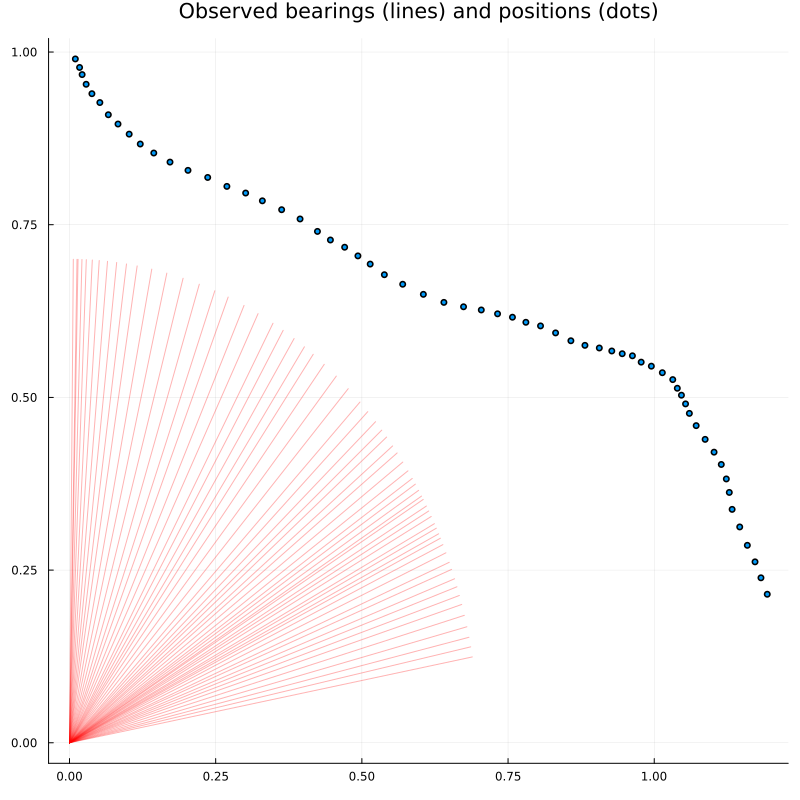

In [18]:
render(trace)
title!("Observed bearings (lines) and positions (dots)")

Note that these are the observed *bearings*, but we are not plotting the
"ground truth" *locations* of the ship. There are many trajectories consistent
with these bearings; for each of the red rays in the above plot, the ship
could be anywhere along the ray (or even slightly off it, given that our
measurements are noisy). However, our assumptions about the dynamics of the
situation &mdash; that is, the conditional distributions $P(x_{t+1}, y_{t+1}
\mid x_t, y_t)$ &mdash; will ensure that physics-defying trajectories (e.g.,
where the ship moves from a very high Y coordinate to a very low one in a
short time) are ruled out.

## 2. Implementing a basic particle filter <a name="basic-pf"></a>

In Gen, a **particle is represented as a trace** and the particle filter
state contains a weighted collection of traces. Below we define an inference
program that runs a particle filter on an observed data set of bearings
(`zs`). We use `num_particles` particles internally, and then we return a
sample of `num_samples` traces from the weighted collection that the particle
filter produces.

Gen provides methods for initializing and updating the state of a particle
filter, documented in [Particle Filtering](https://www.gen.dev/dev/ref/pf/).

- `Gen.initialize_particle_filter`

- `Gen.particle_filter_step!`

Both of these methods can used either with the default proposal or a custom
proposal. In this
problem,
we will use the default proposal. There is also a method that resamples
particles based on their weights, which serves to redistribute the particles
to more promising parts of the latent space.

- `Gen.maybe_resample!`

Gen also provides a method for sampling a collection of unweighted traces
from the current weighted collection in the particle filter state:

- `Gen.sample_unweighted_traces`

In [19]:
function particle_filter(num_particles::Int, zs_0_0::Vector{Float64}, num_samples::Int)

    # construct initial observations
    init_obs = Gen.choicemap((:z_0_0_initial, zs_0_0[1]))
    state = Gen.initialize_particle_filter(model, (0,), init_obs, num_particles)

    # steps
    for t=1:length(zs_0_0)-1
        Gen.maybe_resample!(state, ess_threshold=num_particles/2)
        obs = Gen.choicemap(((:z_0_0, t), zs_0_0[t+1]))
        # print("t=$t:\n")
        # print(state)
        # print("\n\n")
        Gen.particle_filter_step!(state, (t,), (UnknownChange(),), obs)
    end

    # return a sample of unweighted traces from the weighted collection
    return Gen.sample_unweighted_traces(state, num_samples)
end;

The initial state is obtained by providing the following to
`initialize_particle_filter`:

- The generative function for the generative model (`model`)

- The initial arguments to the generative function.

- The initial observations, expressed as a map from choice address to values
  (`init_obs`).

- The number of particles.

At each step, we resample from the collection of traces (`maybe_resample!`)
and then we introduce one additional bearing measurement by calling
`particle_filter_step!` on the state. We pass the following arguments to
`particle_filter_step!`:

- The state (it will be mutated)

- The new arguments to the generative function for this step. In our case,
  this is the number of measurements beyond the first measurement.

- The [argdiff](https://www.gen.dev/dev/ref/gfi/#Argdiffs-1)
  value, which provides detailed information about the change to the
  arguments between the previous step and this step. We will revisit this
  value later.  For now, we indicate that we do not know how the `T::Int`
  argument will change with each step.

- The new observations associated with the new step. In our case, this just
  contains the latest measurement.


We run this particle filter with 5000 particles, and return a sample of 200
particles. This will take 30-60 seconds. We will see one way of speeding up
the particle filter in a later section.

In [20]:
@time pf_traces = particle_filter(500, zs_0_0, zs_1_1, 200);

  6.825050 seconds (101.29 M allocations: 3.298 GiB, 13.65% gc time, 0.27% compilation time)


To render these traces, we first define a function that overlays many
renderings:

In [21]:
function overlay(renderer, traces; same_data=true, args...)
    fig = plot(xlabel="X", ylabel="Y",
        title="Observed bearings (red) and \npositions of individual traces (one color per trace)")
    
    renderer(traces[1], show_data=true, overlay=true, args...)
    for i=2:length(traces)
        renderer(traces[i], show_data=!same_data, overlay=true, args...)
    end
    fig
end;

We then render the traces from the particle filter:

In [22]:
overlay(render, pf_traces)

In [10]:
overlay(render, pf_traces)

In [14]:
overlay(render, pf_traces)

----
<!-- 
# BEGIN ANSWER KEY 2.7

function particle_filter_no_resampling(num_particles::Int, zs::Vector{Float64}, num_samples::Int)

    # construct initial observations
    init_obs = Gen.choicemap((:z0, zs[1]))
    state = Gen.initialize_particle_filter(model, (0,), init_obs, num_particles)

    # steps
    for t=1:length(zs)-1
        obs = Gen.choicemap(((:z, t), zs[t+1]))
        Gen.particle_filter_step!(state, (t,), (UnknownChange(),), obs)
    end

    # return a sample of unweighted traces from the weighted collection
    return Gen.sample_unweighted_traces(state, num_samples)
end;



# Without resampling, we get particle collapse, because the model converges on
# one best guess. This is not desirable; we have lost diversity in our
# samples.

# END ANSWER KEY -->